# Mesh Voxelisation

The goal of this workbook is to create a pipeline to automatically convert a textured mesh into a colored voxel grid by material. 
This way, the network will only have to learn how to predict the voxel colors and not the full intricate textures, this can be separated into a second workflow

## Voxel Structures

Each package has a slightly different way of creating / storing voxel occupacy grids.

### Open3d

open3d has a build-in voxel representation called `VoxelGrid`

#### Import the mesh as open3d

In [4]:
import open3d as o3d
import numpy as np

mesh = o3d.io.read_triangle_mesh("data/textured_chair/Chair_1.obj", True)
mesh.compute_vertex_normals()
scale = 1 / np.max(mesh.get_max_bound() - mesh.get_min_bound())
center = mesh.get_center()
mesh.scale(scale, center=center)


TriangleMesh with 614 points and 807 triangles, and textures of size (4096, 4096) 

In [2]:
o3d.visualization.draw_geometries([mesh])

#### Sample as point cloud to get point colors

In [5]:
pcd = mesh.sample_points_uniformly(number_of_points=100000)

In [21]:
o3d.visualization.draw_geometries([pcd],mesh_show_wireframe=True)

#### Get the point colors from closest surface points

In [6]:
import generationtools as gnt

newColors = gnt.get_point_colors_open3d(mesh, np.asarray(pcd.points))
pcd.colors = o3d.utility.Vector3dVector(np.array(newColors).reshape(-1,3)/255.0)

In [5]:
o3d.visualization.draw_geometries([pcd])

#### Create Voxelgrid from pointcloud

In [7]:
voxelDim = 64
voxel_grid = o3d.geometry.VoxelGrid.create_from_point_cloud(pcd, voxel_size=1.0/voxelDim)

In [7]:
o3d.visualization.draw_geometries([voxel_grid])

### Trimesh

trimesh can also voxelise meshes
compute_stable_poses

#### Import the mesh as a trimesh

In [196]:
import trimesh
import numpy as np
import generationtools as gnt

mesh_path = 'data/textured_chair/Chair_1.obj'
mesh = trimesh.load(mesh_path)
scale = 1 / np.max(mesh.extents)
center = mesh.centroid
for3matx = np.hstack((np.identity(3) * scale, center.reshape((3,1)) ))
transformMtx = np.vstack((for3matx, [0,0,0,1]))
print(transformMtx)
mesh.apply_transform(transformMtx)

[[ 0.05032428  0.          0.          0.38773668]
 [ 0.          0.05032428  0.         12.01399739]
 [ 0.          0.          0.05032428  1.77640333]
 [ 0.          0.          0.          1.        ]]


<trimesh.Trimesh(vertices.shape=(1068, 3), faces.shape=(1614, 3))>

In [ ]:
mesh.show()

#### Voxelise the trimesh

In [206]:
voxelSize = 64
angel_voxel = mesh.voxelized(1/(voxelSize-1)).hollow()
print(angel_voxel.shape)

(36, 64, 41)


In [207]:
voxelPoints = angel_voxel.points
voxelColors = gnt.get_point_colors_trimesh(mesh, voxelPoints)

In [208]:
ids = angel_voxel.points_to_indices(voxelPoints)

# We initialize a array of zeros of size X,Y,Z,4 to contain the colors for each voxel of the voxelized mesh in the grid
cube_color=np.zeros([angel_voxel.shape[0],angel_voxel.shape[1],angel_voxel.shape[2],4])

for i in range(len(voxelPoints)):
    cube_color[ids[i][0],ids[i][1], ids[i][2],:] = voxelColors[i]

In [209]:
# generate a voxelized mesh from the voxel grid representation, using the calculated colors 
voxelized_mesh = angel_voxel.as_boxes(colors=cube_color, )

# Initialize a scene
s = trimesh.Scene()
# Add the voxelized mesh to the scene. If want to also show the intial mesh uncomment the second line and change the alpha channel of in the loop to something <100
s.add_geometry(voxelized_mesh)
# s.add_geometry(mesh)
s.show()

In [185]:
# generate a voxelized mesh from the voxel grid representation, using the calculated colors 
marched_mesh = angel_voxel.marching_cubes

# Initialize a scene
s = trimesh.Scene()
# Add the voxelized mesh to the scene. If want to also show the intial mesh uncomment the second line and change the alpha channel of in the loop to something <100
s.add_geometry(marched_mesh)
# s.add_geometry(mesh)
s.show()

## Workflow

- Import the mesh and texture
- Split the texture by material and re-colour the mesh to the material types
- Voxelize the full mesh
- give each voxel the color of the material index

In [ ]:
import open3d as o3d
import trimesh

datasetPath = "C:/Users/u0146408/Documents/Datasets/Shapenet/03001627/"
meshPath = datasetPath + "1a6f615e8b1b5ae4dbbc9440457e303e/models/model_normalized.obj"

In [15]:
mesh = o3d.io.read_triangle_mesh(meshPath, True, True)
#o3d.visualization.draw_geometries([mesh],mesh_show_wireframe=True)
print(mesh.triangle_material_ids)


NameError: name 'meshPath' is not defined

## Voxel Remeshing

A look at different methods of remshing the resulting voxel grid

In [8]:
# o3d.VoxelGrid to 3d np array
voxels = voxel_grid.get_voxels()  # returns list of voxels
indices = np.stack(list(vx.grid_index for vx in voxels))
colors = np.stack(list(vx.color for vx in voxels))

print(len(voxels))

7495


In [9]:
voxel_array = np.zeros([65,65,65])

for index in indices:
    voxel_array[index[0], index[1], index[2]] = 1

In [12]:
import skimage
import trimesh

vertices, faces, normals, _ = skimage.measure.marching_cubes(voxel_array, level=0)
mesh = trimesh.Trimesh(vertices=vertices, faces=faces, vertex_normals=normals)
mesh.show()

In [13]:
mesh.export('brokenChair.obj')

'# https://github.com/mikedh/trimesh\nv 0.00000000 0.00000000 2.00000000\nv 0.00000000 1.00000000 2.00000000\nv 1.00000000 0.00000000 2.00000000\nv 1.00000000 1.00000000 2.00000000\nv 1.00000000 1.00000000 4.00000000\nv 1.00000000 1.00000000 4.00000000\nv 1.00000000 1.00000000 4.00000000\nv 1.00000000 1.00000000 5.00000000\nv 1.00000000 1.00000000 5.00000000\nv 1.00000000 1.00000000 5.00000000\nv 0.00000000 0.00000000 7.00000000\nv 1.00000000 0.00000000 7.00000000\nv 0.00000000 1.00000000 7.00000000\nv 1.00000000 1.00000000 7.00000000\nv 0.00000000 1.00000000 37.00000000\nv 1.00000000 1.00000000 36.00000000\nv 1.00000000 0.00000000 37.00000000\nv 1.00000000 0.00000000 38.00000000\nv 0.00000000 1.00000000 38.00000000\nv 1.00000000 0.00000000 39.00000000\nv 0.00000000 1.00000000 39.00000000\nv 1.00000000 0.00000000 40.00000000\nv 0.00000000 1.00000000 40.00000000\nv 1.00000000 0.00000000 41.00000000\nv 0.00000000 1.00000000 41.00000000\nv 1.00000000 1.00000000 42.00000000\nv 0.00000000 2

## Implicit Representation: Distance Field

Using open3d to create a raycasting scene and creating a voxel grid based on the distance queries

In [43]:
import open3d as o3d
import numpy as np

mesh = o3d.io.read_triangle_mesh("data/textured_chair/Chair_1.obj", True)
halfMesh = o3d.io.read_triangle_mesh("data/textured_chair/Chair_1_Half.obj", True)
mesh.compute_vertex_normals()
halfMesh.compute_vertex_normals()
scale = 1 / np.max(mesh.get_max_bound() - mesh.get_min_bound())
center = mesh.get_center()
mesh.scale(scale, center=center)
halfMesh.scale(scale, center=center)

# Load mesh and convert to open3d.t.geometry.TriangleMesh
mesh = o3d.t.geometry.TriangleMesh.from_legacy(mesh)
halfMesh = o3d.t.geometry.TriangleMesh.from_legacy(halfMesh)

# Create a scene and add the triangle mesh
scene = o3d.t.geometry.RaycastingScene()
_ = scene.add_triangles(mesh)  # we do not need the geometry ID for mesh

halfScene = o3d.t.geometry.RaycastingScene()
_ = halfScene.add_triangles(halfMesh)  # we do not need the geometry ID for mesh

In [48]:
from matplotlib import pyplot as plt

min_bound = mesh.vertex.positions.min(0).numpy()
max_bound = mesh.vertex.positions.max(0).numpy()

xyz_range = np.linspace(min_bound, max_bound, num=64)

# query_points is a [32,32,32,3] array ..
query_points = np.stack(np.meshgrid(*xyz_range.T), axis=-1).astype(np.float32)

# signed distance is a [32,32,32] array
signed_distance = scene.compute_occupancy(query_points)
half_distance = halfScene.compute_distance(query_points)


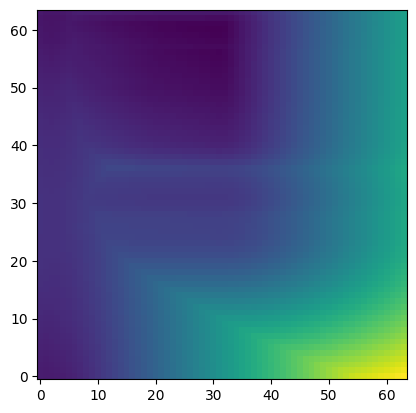

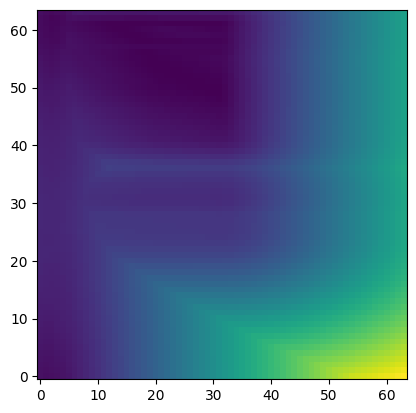

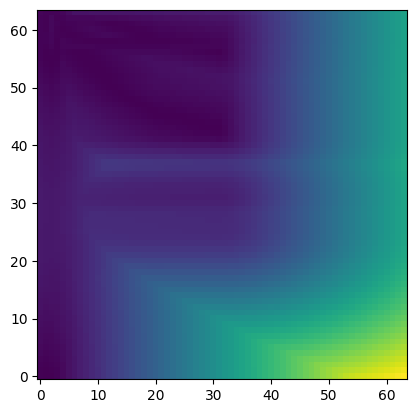

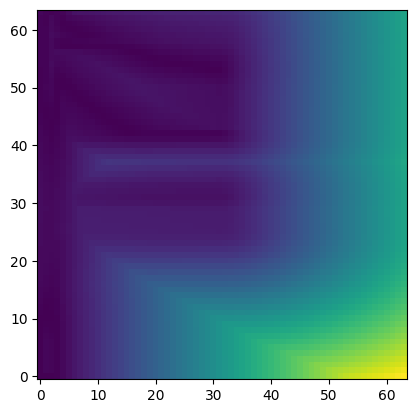

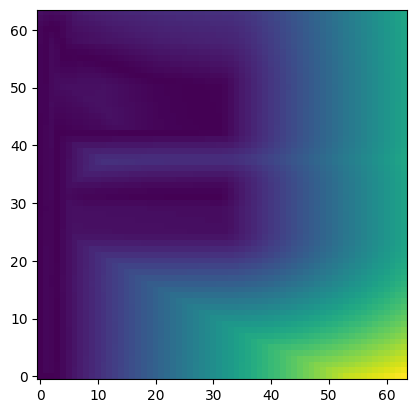

...

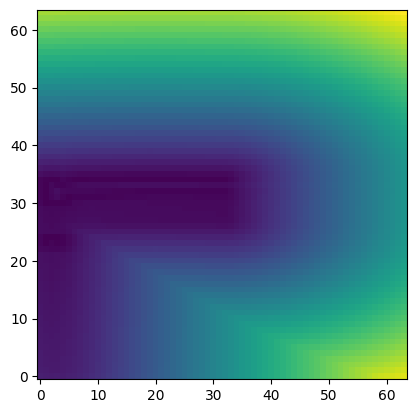

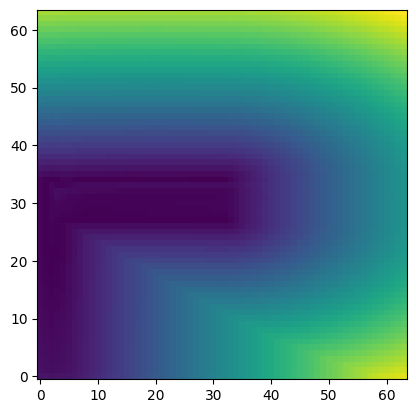

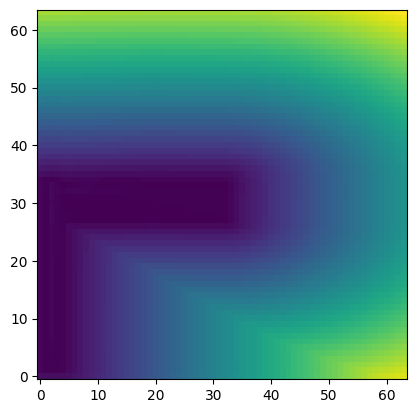

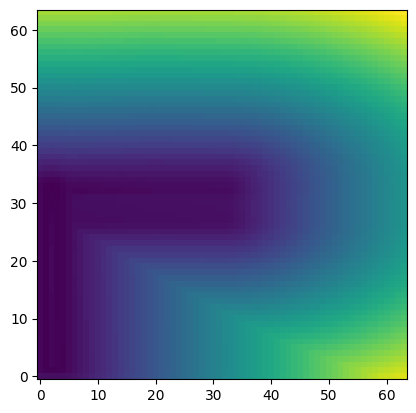

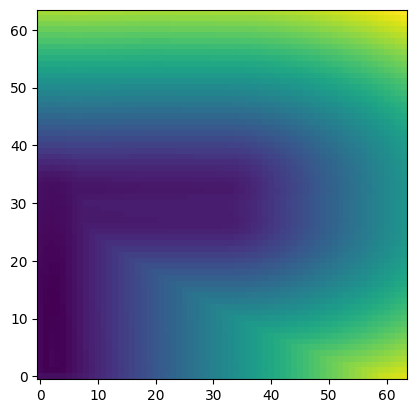

In [49]:
for i in range(32):
# We can visualize a slice of the distance field directly with matplotlib
    plt.imshow(half_distance.numpy()[:, :, i*2])
    ax = plt.gca()
    ax.invert_yaxis()
    plt.show()

In [30]:
print(signed_distance.numpy())

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 1. 1. 0.]
  ...
  [0. 0. 0. ... 1. 1. 0.]
  [0. 0. 0. ... 1. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 1. ... 0. 0. 0.]
  [0. 0. 1. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 1. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]


In [35]:
import skimage
import trimesh

vertices, faces, normals, _ = skimage.measure.marching_cubes(signed_distance.numpy(), level=0)
mesh = trimesh.Trimesh(vertices=vertices, faces=faces, vertex_normals=normals)
mesh.fix_normals()
mesh.show()

In [40]:
vertices, faces, normals, _ = skimage.measure.marching_cubes(half_distance.numpy(), level=0)
mesh = trimesh.Trimesh(vertices=vertices, faces=faces, vertex_normals=normals)
mesh.fix_normals()
mesh.show()

In [36]:
mesh.export('brokenChair2.obj')

'# https://github.com/mikedh/trimesh\nv 0.00000000 1.00000000 5.00000000\nv 1.00000000 1.00000000 4.00000000\nv 1.00000000 0.00000000 5.00000000\nv 1.00000000 0.00000000 6.00000000\nv 0.00000000 1.00000000 6.00000000\nv 1.00000000 0.00000000 7.00000000\nv 0.00000000 1.00000000 7.00000000\nv 1.00000000 0.00000000 8.00000000\nv 0.00000000 1.00000000 8.00000000\nv 1.00000000 0.00000000 9.00000000\nv 0.00000000 1.00000000 9.00000000\nv 1.00000000 1.00000000 10.00000000\nv 0.00000000 2.00000000 5.00000000\nv 1.00000000 2.00000000 4.00000000\nv 0.00000000 2.00000000 6.00000000\nv 0.00000000 2.00000000 7.00000000\nv 0.00000000 2.00000000 8.00000000\nv 0.00000000 2.00000000 9.00000000\nv 1.00000000 2.00000000 10.00000000\nv 1.00000000 3.00000000 5.00000000\nv 1.00000000 3.00000000 6.00000000\nv 1.00000000 3.00000000 7.00000000\nv 1.00000000 3.00000000 8.00000000\nv 1.00000000 3.00000000 9.00000000\nv 0.00000000 60.00000000 4.00000000\nv 1.00000000 60.00000000 3.00000000\nv 1.00000000 59.000000